# Universidade Estadual do Amazonas

## Pós Graduação em Ciência de Dados

## Fundamentos de Machine Learning

#### Alunos:
* Abner
* Emiliandro
* Samuel
* Wendel

Aplicação de Machine Learning em bases de dados metereológicos

Referências:    
    https://www.kaggle.com/abnerneves/estacao-met-manaus    
    http://bancodedados.cptec.inpe.br/

#### Importação de Bibliotecas

In [1]:
%%time
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from os import listdir
from os.path import isfile, join
import datetime as dt

Wall time: 5.86 s


In [2]:
#Lista arquivos disponíveis 
files = [f for f in listdir(os.getcwd()) if isfile(join(os.getcwd(), f))]
files

['INMET_N_AM_A101_MANAUS_01-01-2001_A_31-12-2001.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2002_A_31-12-2002.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2003_A_31-12-2003.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2004_A_31-12-2004.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2005_A_31-12-2005.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2006_A_31-12-2006.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2007_A_31-12-2007.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2008_A_31-12-2008.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2009_A_31-12-2009.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2010_A_31-12-2010.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2011_A_31-12-2011.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2012_A_31-12-2012.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2013_A_31-12-2013.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2014_A_31-12-2014.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2015_A_31-12-2015.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2016_A_31-12-2016.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2017_A_31-12-2017.CSV',
 'INMET_N_AM_A101_MANAUS_01-01-2018_A_31-12-2018.CSV',
 'INMET_N_

In [3]:
# Criando um Dataframe vazio para receber todos dos dados
# Create a empty Dataframe to store all data
df = pd.DataFrame()  

In [4]:
%%time
# Lista para nomes das colunas, necessário retirar caracteres
# List of columns names, needed to extract all missing characters
renomear_colunas = ["DATA","HORA",
                    "PRECIP TOTAL",
                    "P ATM EST",
                    "P ATM MAX",
                    "P ATM MIN",
                    "RAD GLB",
                    "TEMP AR",
                    "TEMP ORV",
                    "TEMP MAX",
                    "TEMP MIN",
                    "TEMP ORV MAX",
                    "TEMP ORV MIN",
                    "UMID MAX",
                    "UMID MIN",
                    "UMID",
                    "VENTO DRC",
                    "VENTO RAJ MAX",
                    "VENTO VEL",
                    "Unnamed"]
# O ultimo item da lista, serve para capturar os dados que serão importados  já que cada linha dos arquivos terminam com ;
# The last item of the list is needed to catch all data, there is a wrong format in the source file

Wall time: 0 ns


In [5]:
%%time
# Percorre a lista de arquivos csv e fazendo o append no DataFrame
# Run through the file list, storing all data in the Dataframe
for i in files:
    if(i[-3:])=="CSV":
        df = df.append(pd.read_csv(i,sep=";", encoding="cp860", skiprows=8, names = renomear_colunas, header = 0),ignore_index = True)

Wall time: 1.22 s


In [6]:
# Excluindo coluna de lixo
# Deleting the last column
df.drop("Unnamed", axis=1, inplace = True)

In [7]:
df.columns

Index(['DATA', 'HORA', 'PRECIP TOTAL', 'P ATM EST', 'P ATM MAX', 'P ATM MIN',
       'RAD GLB', 'TEMP AR', 'TEMP ORV', 'TEMP MAX', 'TEMP MIN',
       'TEMP ORV MAX', 'TEMP ORV MIN', 'UMID MAX', 'UMID MIN', 'UMID',
       'VENTO DRC', 'VENTO RAJ MAX', 'VENTO VEL'],
      dtype='object')

In [8]:
%%time
# Altera , para . para converter de str para float
# Replace , to . to convert from str to float
df.replace(",",".", regex = True, inplace = True)

Wall time: 2.97 s


In [9]:
%%time
# Altera / para - para converter de str para datetime
# Replace / to - to convert from str to datetime
df["DATA"].replace("/","-", regex = True, inplace = True)

Wall time: 201 ms


In [10]:
%%time
# Uniformizando as horas
# Correct the hour format
df["HORA"].replace(" UTC","", regex = True, inplace = True)

Wall time: 209 ms


In [11]:
# Criando coluna com Data e Hora para criação do tipo Datetime
df["DATA_HORA"] = df["DATA"] +" " + df["HORA"]

In [12]:
%%time
# convertando para datetime
# Convert to Datetime
df["DATA_HORA"] = pd.to_datetime(df["DATA_HORA"], errors = "ignore", format="%Y-%m-%d %H:%M")

Wall time: 134 ms


In [13]:
# Ordenando
# Sorting
df.sort_values(by=["DATA_HORA"], inplace = True)

In [14]:
# Verificando a ordenação das datas
# Checking 

df['DATA_HORA']

171648   2000-05-09 00:00:00
171649   2000-05-09 01:00:00
171650   2000-05-09 02:00:00
171651   2000-05-09 03:00:00
171652   2000-05-09 04:00:00
                 ...        
171643   2020-07-31 19:00:00
171644   2020-07-31 20:00:00
171645   2020-07-31 21:00:00
171646   2020-07-31 22:00:00
171647   2020-07-31 23:00:00
Name: DATA_HORA, Length: 177336, dtype: datetime64[ns]

In [15]:
%%time
# Altera os dados -9999 para NaN para uma melhor estratégia de substituição dos dados faltantes
# Replace -9999 to Nan
df.replace("-9999.000000", np.NaN, inplace=True)
df.replace("-9999", np.NaN, inplace=True)
df.replace(-9999, np.NaN, inplace=True)

Wall time: 184 ms


In [16]:
# Reset do index
df.reset_index(drop = True, inplace = True)
# Quando o reset_index é usado, o indice antigo é adiconado ao Dataframe como uma coluna, portanto precisa ser excluido utilizando o parametro drop = True

In [17]:
df.head()

,DATA,HORA,PRECIP TOTAL,P ATM EST,P ATM MAX,P ATM MIN,RAD GLB,TEMP AR,TEMP ORV,TEMP MAX,TEMP MIN,TEMP ORV MAX,TEMP ORV MIN,UMID MAX,UMID MIN,UMID,VENTO DRC,VENTO RAJ MAX,VENTO VEL,DATA_HORA
0,2000-05-09,00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-05-09 00:00:00
1,2000-05-09,01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-05-09 01:00:00
2,2000-05-09,02:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-05-09 02:00:00
3,2000-05-09,03:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-05-09 03:00:00
4,2000-05-09,04:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-05-09 04:00:00


In [18]:
%%time

df["PRECIP TOTAL"] = pd.to_numeric(df["PRECIP TOTAL"])

df["P ATM EST"] = pd.to_numeric(df["P ATM EST"])

df["P ATM MAX"] = pd.to_numeric(df["P ATM MAX"])

df["P ATM MIN"] = pd.to_numeric(df["P ATM MIN"])

df["RAD GLB"] = pd.to_numeric(df["RAD GLB"])

df["TEMP AR"] = pd.to_numeric(df["TEMP AR"])

df["TEMP ORV"] = pd.to_numeric(df["TEMP ORV"])

df["TEMP MAX"] = pd.to_numeric(df["TEMP MAX"])

df["TEMP MIN"] = pd.to_numeric(df["TEMP MIN"])

df["TEMP ORV MAX"] = pd.to_numeric(df["TEMP ORV MAX"])

df["TEMP ORV MIN"] = pd.to_numeric(df["TEMP ORV MIN"])

df["VENTO RAJ MAX"] = pd.to_numeric(df["VENTO RAJ MAX"])

df["VENTO VEL"] = pd.to_numeric(df["VENTO VEL"])

Wall time: 623 ms


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177336 entries, 0 to 177335
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   DATA           177336 non-null  object        
 1   HORA           177336 non-null  object        
 2   PRECIP TOTAL   143744 non-null  float64       
 3   P ATM EST      143104 non-null  float64       
 4   P ATM MAX      142393 non-null  float64       
 5   P ATM MIN      142393 non-null  float64       
 6   RAD GLB        83423 non-null   float64       
 7   TEMP AR        143830 non-null  float64       
 8   TEMP ORV       143561 non-null  float64       
 9   TEMP MAX       143185 non-null  float64       
 10  TEMP MIN       143184 non-null  float64       
 11  TEMP ORV MAX   142903 non-null  float64       
 12  TEMP ORV MIN   142901 non-null  float64       
 13  UMID MAX       142912 non-null  float64       
 14  UMID MIN       142911 non-null  float64       
 15  

In [20]:
df.drop(['DATA', 'HORA'], inplace = True, axis = 1)

In [21]:
df['ano'] = df['DATA_HORA'].dt.year
df['mes'] = df['DATA_HORA'].dt.month
df['dia'] = df['DATA_HORA'].dt.day
df.drop("DATA_HORA", inplace = True, axis =1)

In [22]:
df.head()

,PRECIP TOTAL,P ATM EST,P ATM MAX,P ATM MIN,RAD GLB,TEMP AR,TEMP ORV,TEMP MAX,TEMP MIN,TEMP ORV MAX,TEMP ORV MIN,UMID MAX,UMID MIN,UMID,VENTO DRC,VENTO RAJ MAX,VENTO VEL,ano,mes,dia
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,5,9
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,5,9
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,5,9
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,5,9
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000,5,9


In [23]:
df.dropna(inplace = True)

In [24]:
df.reset_index(drop = True, inplace = True)

In [25]:
df.head()

,PRECIP TOTAL,P ATM EST,P ATM MAX,P ATM MIN,RAD GLB,TEMP AR,TEMP ORV,TEMP MAX,TEMP MIN,TEMP ORV MAX,TEMP ORV MIN,UMID MAX,UMID MIN,UMID,VENTO DRC,VENTO RAJ MAX,VENTO VEL,ano,mes,dia
0,0.0,1002.6,1002.8,1002.6,386.0,29.4,23.1,29.8,29.4,23.3,22.6,69.0,65.0,69.0,96.0,2.9,0.8,2000,5,9
1,0.0,1002.8,1002.8,1002.5,184.0,26.9,24.1,29.5,26.9,24.3,22.8,85.0,68.0,84.0,184.0,1.9,0.1,2000,5,9
2,0.0,1006.8,1006.8,1006.3,207.0,25.2,24.5,25.2,23.9,24.5,23.5,98.0,96.0,96.0,270.0,1.0,0.3,2000,5,10
3,0.0,1007.7,1007.7,1006.8,745.0,27.1,25.2,27.4,25.2,25.2,24.5,96.0,85.0,89.0,204.0,1.1,0.4,2000,5,10
4,0.0,1008.3,1008.3,1007.8,916.0,28.1,23.8,28.1,26.9,25.6,23.8,91.0,78.0,78.0,64.0,1.5,0.7,2000,5,10


In [26]:
df_diario = df.groupby(['ano', 'mes', 'dia']).agg({"PRECIP TOTAL":np.sum,\
                                                  "P ATM EST":np.mean,\
                                                  "P ATM MAX":np.max,\
                                                  "P ATM MIN":np.min,\
                                                  "RAD GLB":np.mean,\
                                                  "TEMP AR":np.mean,\
                                                  "TEMP ORV":np.mean,\
                                                  "TEMP MAX":np.max,\
                                                  "TEMP MIN":np.min})

In [27]:
df_diario = df_diario.sort_index().reset_index().copy()

In [28]:
df_diario

,ano,mes,dia,PRECIP TOTAL,P ATM EST,P ATM MAX,P ATM MIN,RAD GLB,TEMP AR,TEMP ORV,TEMP MAX,TEMP MIN
0,2000,5,9,0.0,1002.700000,1002.8,1002.5,285.000000,28.150000,23.600000,29.8,26.9
1,2000,5,10,0.0,1005.491667,1008.3,1002.4,1597.666667,29.075000,23.675000,32.2,23.9
2,2000,5,11,0.0,1004.683333,1007.6,1001.7,1705.583333,29.175000,23.866667,31.3,24.0
3,2000,5,12,4.2,1004.191667,1006.5,1001.3,475.500000,25.641667,23.891667,27.8,24.0
4,2000,5,13,1.4,1004.150000,1006.8,1001.3,1193.416667,27.166667,23.658333,30.6,23.3
...,...,...,...,...,...,...,...,...,...,...,...,...
5904,2020,7,27,0.0,1005.550000,1007.4,1003.1,857.950000,29.786364,19.913636,34.4,24.9
5905,2020,7,28,0.0,1005.481818,1007.7,1003.5,525.536364,29.768182,20.363636,33.1,26.9
5906,2020,7,29,0.0,1006.181818,1007.8,1004.2,876.945455,29.568182,19.154545,34.3,24.3
5907,2020,7,30,0.0,1006.254545,1007.9,1004.1,860.227273,29.686364,15.786364,34.5,22.7


In [29]:
target = df_diario["PRECIP TOTAL"].copy()

In [30]:
target_nm = target.copy()

In [31]:
target.replace(0.0, False, inplace = True)

In [32]:
target[target != False] = True

Pricipitação Total = 0 significa que não houve chuva, qualquer número maior que zero, houve chuva

In [33]:
target = target.astype("category")

In [34]:
target

0       False
1       False
2       False
3        True
4        True
        ...  
5904    False
5905    False
5906    False
5907    False
5908    False
Name: PRECIP TOTAL, Length: 5909, dtype: category
Categories (2, object): [False, True]

In [35]:
df_diario.drop(["PRECIP TOTAL", "ano", 'mes', 'dia'], inplace = True, axis = 1)

## Dados Prontos para uso

In [36]:
df_diario.head()

,P ATM EST,P ATM MAX,P ATM MIN,RAD GLB,TEMP AR,TEMP ORV,TEMP MAX,TEMP MIN
0,1002.700000,1002.8,1002.5,285.000000,28.150000,23.600000,29.8,26.9
1,1005.491667,1008.3,1002.4,1597.666667,29.075000,23.675000,32.2,23.9
2,1004.683333,1007.6,1001.7,1705.583333,29.175000,23.866667,31.3,24.0
3,1004.191667,1006.5,1001.3,475.500000,25.641667,23.891667,27.8,24.0
4,1004.150000,1006.8,1001.3,1193.416667,27.166667,23.658333,30.6,23.3


In [37]:
target.head()

0    False
1    False
2    False
3     True
4     True
Name: PRECIP TOTAL, dtype: category
Categories (2, object): [False, True]

In [38]:
print(f"A base dados tem {df_diario.shape[0]} entrada")

A base dados tem 5909 entrada


In [39]:
target.value_counts()

False    3389
True     2520
Name: PRECIP TOTAL, dtype: int64

----------------------------

## Regressão Linear

In [42]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

df.shape, X.shape, y.shape

((78771, 20), (78771, 19), (78771,))

In [60]:
y = y.astype(int)

In [44]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.2)

In [45]:
from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
X_poly = poly_features.fit_transform(X)

In [46]:
%%time
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_poly, y)

Wall time: 1.12 s


LinearRegression()

In [47]:
print(f"y_previsto = {lin_reg.coef_[0]:.2f} * x^2 + {lin_reg.coef_[1]:.2f} * x + {lin_reg.intercept_:.2f}")

y_previsto = -20.81 * x^2 + -27.32 * x + 3307.72


## KNeighborsClassifier

In [64]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.2)

In [65]:
%%time
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Wall time: 20 ms


In [66]:
%%time
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(scaler.transform(X_train), y_train)

Wall time: 84.6 ms


KNeighborsClassifier()

In [67]:
y_pred = classifier.predict(X_test)

In [68]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98     60065
           1       0.00      0.00      0.00       784
           2       0.00      0.00      0.00       456
           3       0.00      0.00      0.00       356
           4       0.00      0.00      0.00       236
           5       0.00      0.00      0.00       165
           6       0.00      0.00      0.00       132
           7       0.00      0.00      0.00       103
           8       0.00      0.00      0.00        82
           9       0.00      0.00      0.00        83
          10       0.00      0.00      0.00        64
          11       0.00      0.00      0.00        45
          12       0.00      0.00      0.00        51
          13       0.00      0.00      0.00        43
          14       0.00      0.00      0.00        38
          15       0.00      0.00      0.00        26
          16       0.00      0.00      0.00        28
          17       0.00    

In [69]:
%%time
error = []

# Calculating error for K values between 1 and 40
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))

Wall time: 14min 36s


Text(0, 0.5, 'Mean Error')

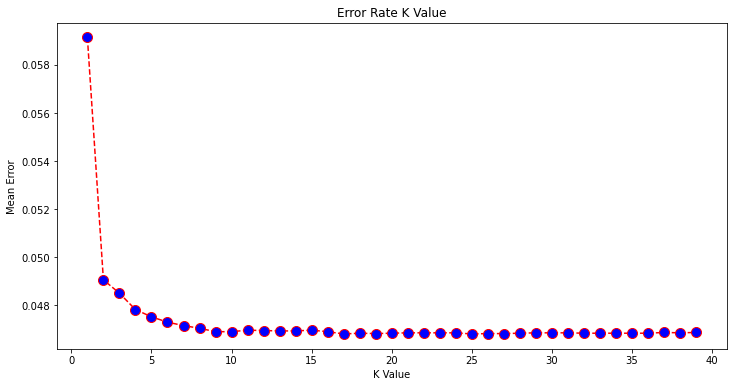

In [70]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='red', linestyle='dashed', marker='o', markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

## Gaussian Naive Bayes

In [71]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.9)

In [72]:
from sklearn.naive_bayes import GaussianNB
gau_model = GaussianNB()
gau_model.fit(X_train, y_train)

y_pred  = gau_model.predict(X_test)

In [73]:
from sklearn import metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7319116527037319


## LogisticRegression

In [74]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.2)

In [75]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

C:\Users\abner\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [76]:
log_reg.score(X_test, y_test)

0.9537109034070171

## MLPRegressor

In [77]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [78]:
from sklearn.neural_network import MLPRegressor
mlp_model = MLPRegressor(hidden_layer_sizes=(100,), activation = 'relu', solver= 'adam', learning_rate_init = 0.2)
mlp_model.fit(X_train, y_train)

MLPRegressor(learning_rate_init=0.2)

In [79]:
mlp_model.score(X_test, y_test)

-6.542485586957802e-05

In [80]:
X_test[0].reshape(1,-1)

array([[1.0041e+03, 1.0041e+03, 1.0035e+03, 1.8880e+02, 2.9600e+01,
        2.1000e+01, 3.0400e+01, 2.9500e+01, 2.1400e+01, 2.0500e+01,
        6.1000e+01, 5.7000e+01, 6.0000e+01, 8.6000e+01, 4.3000e+00,
        1.6000e+00, 2.0120e+03, 6.0000e+00, 1.5000e+01]])

In [81]:
mlp_model.predict(X_test[919].reshape(1,-1)), y_test[919]

(array([0.27461395]), 0)

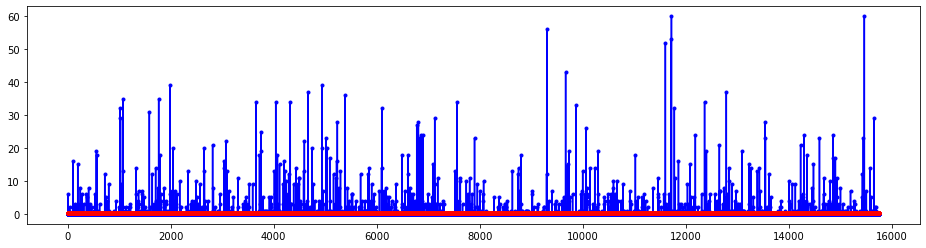

In [82]:
y_pred = []
for i in (X_test):
  y_pred.append(mlp_model.predict(i.reshape(1, -1)))

fig = plt.figure(figsize=(16, 4))
plt.plot(y_test, 'b.-')
plt.plot(y_pred, 'r.-')

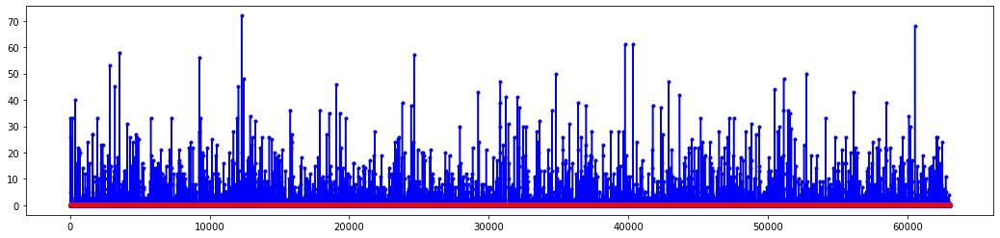

In [83]:
y_pred_train = []
for i in (X_train):
  y_pred_train.append(mlp_model.predict(i.reshape(1, -1)))

fig = plt.figure(figsize=(18, 4))
plt.plot(y_train, 'b.-')
plt.plot(y_pred_train, 'r.-')

## MLPClassifier

In [84]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [85]:
from sklearn.neural_network import MLPClassifier
mlpc_model = MLPClassifier(hidden_layer_sizes= 100, activation= 'relu', solver = 'adam', verbose=False,)
mlpc_model.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=100)

In [86]:
mlpc_model.score(X_test, y_test)

0.9547224102911307

In [87]:
mlpc_model.score(X_train, y_train)

0.9527013547579753